In [ ]:
!pip install sentence-transformers
!pip install pandas

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 227.1/227.1 kB 3.7 MB/s eta 0:00:00


In [ ]:
import pandas as pd

df = pd.read_csv("530-sentences.csv")

df.dropna(inplace=True)
df.drop('Unnamed: 0', axis=1, inplace=True)
df.loc[df.loc[:,'Tone'] == 'highly formal', 'Tone'] = 'formal'
df.loc[df.loc[:,'Tone'] == 'highly', 'Tone'] = 'formal'
df.loc[df.loc[:,'Tone'] == 'dismissive', 'Tone'] = 'contemptuous'
df.loc[df.loc[:,'Tone'] == 'disdainful', 'Tone'] = 'contemptuous'
df.loc[df.loc[:,'Dialogue Type'] == 'official', 'Dialogue Type'] = 'formal'

df

,English Sentence,Persian Sentence,Arabic Sentence,Subject,Tone,Emotion,Dialogue Type,Number of Tokens
0,"During World War II, millions of innocent peop...",در دوران جنگ جهانی دوم، میلیون‌ها نفر از مردم ...,خلال الحرب العالمية الثانية، قُتل ملايين من ال...,"History (war, literature, art)",formal,neutral,administrative,64
1,"In Iranian literature, Ferdowsi's epic poems h...",در ادبیات ایران، اشعار حماسی فردوسی همواره به...,في الأدب الإيراني، تُعتبر أشعار فردوسي البطولي...,"History (war, literature, art)",formal,positive,administrative,64
2,"Throughout history, artists have always tried ...",هنرمندان در طول تاریخ همواره تلاش کرده‌اند تا...,على مرّ التاريخ، حاول الفنانون دائماً من خلال ...,"History (war, literature, art)",formal,positive,administrative,64
3,"Civil wars in many countries, besides causing ...",جنگ‌های داخلی در بسیاری از کشورها، علاوه بر خ...,الحروب الأهلية في العديد من البلدان، بالإضافة ...,"History (war, literature, art)",contemptuous,negative,administrative,64
4,Many war stories have successfully portrayed a...,بسیاری از داستان‌های جنگی به خوبی توانسته‌اند...,العديد من قصص الحرب نجحت في عرض صورة واقعية من...,"History (war, literature, art)",friendly,neutral,formal,64
...,...,...,...,...,...,...,...,...
525,"Cinema, as a comprehensive and complex art for...",۱. سینما به عنوان یک هنر جامع و پیچیده، توانست...,السينما كفن شامل ومعقد، استطاعت خلال العقود ال...,"Cinema, Philosophy, Art history",friendly,positive,casual,512
526,"Unfortunately, many films that address philoso...",۲. متأسفانه، بسیاری از فیلم‌هایی که به بررسی م...,للأسف، العديد من الأفلام التي تتناول القضايا ا...,"Cinema, Philosophy, Art history",derisive,negative,casual,512
527,Analyzing the impact of cinema on philosophica...,۳. تحلیل تأثیرات سینما بر مفاهیم فلسفی و تاریخ...,في تحليل تأثيرات السينما على المفاهيم الفلسفية...,"Cinema, Philosophy, Art history",completely,neutral,administrative,512
528,Films that explore historical and philosophica...,۴. فیلم‌های سینمایی که به موضوعات تاریخی و فلس...,الأفلام التي تتناول المواضيع التاريخية والفلسف...,"Cinema, Philosophy, Art history",friendly,positive,local,512


In [ ]:
import numpy as np

def calculate_ndcg(standard_data, comparing_data, k):
    # Prevent getting diagonal line
    np.fill_diagonal(standard_data.values, 0)

    dcg = 0
    idcg = 0

    for i in range(len(standard_data)):
        # Get top-k standard and base rankings
        standard_ranking = standard_data.iloc[i].sort_values(ascending=False).index.tolist()[:k]
        base_ranking = comparing_data.iloc[i].sort_values(ascending=False).index.tolist()[:k]

        # DCG calculation: Gain comes from predicted ranking
        for rank, idx in enumerate(base_ranking):
            if idx in standard_ranking:
                dcg += 1 / np.log2(rank + 2)

        # IDCG calculation: Perfect ranking (ideal)
        for ideal_rank in range(min(k, len(standard_ranking))):
            idcg += 1 / np.log2(ideal_rank + 2)

    return dcg / idcg if idcg > 0 else 0

In [ ]:
def calculate_mrr(standard_data, comparing_data):
    # Prevent getting diagonal line
    np.fill_diagonal(standard_data.values, 0)

    max_similarities = standard_data.idxmax(axis=1)

    mrr = 0

    for i in range(len(max_similarities)):
        max_similarity = max_similarities[i]

        # Get rank (1-based) from predicted ranking
        try:
            rank = comparing_data.iloc[i].sort_values(ascending=False).index.tolist().index(max_similarity) + 1
            mrr += 1 / rank
        except ValueError:
            pass  # If not found, skip

    mrr /= len(max_similarities)

    return mrr

In [ ]:
def calculate_map(standard_data, comparing_data, k):
    # Prevent getting diagonal line
    np.fill_diagonal(standard_data.values, 0)

    total_ap = 0  # To accumulate average precision for all queries
    num_queries = len(standard_data)  # Total number of queries

    for i in range(num_queries):
        # Get top-k predicted ranking from comparing_data
        base_ranking = comparing_data.iloc[i].sort_values(ascending=False).index.tolist()[:k]

        # Get true relevant items from standard_data
        relevant_items = standard_data.iloc[i].sort_values(ascending=False).index.tolist()[:k]

        # Calculate precision at each rank where relevant items appear
        num_relevant = 0
        precision_sum = 0

        for rank, item in enumerate(base_ranking, 1):  # rank is 1-based
            if item in relevant_items:
                num_relevant += 1
                precision_sum += num_relevant / rank  # Precision at this rank

        # Calculate average precision for this query
        if num_relevant > 0:
            average_precision = precision_sum / num_relevant
        else:
            average_precision = 0  # No relevant items in top-k

        total_ap += average_precision  # Accumulate AP for each query

    # Mean Average Precision
    map_score = total_ap / num_queries

    return map_score

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
from time import time

class test_model:
  def __init__(self, model, data):
    self._en_sentences = data.loc[:, 'English Sentence'].tolist()
    self._fa_sentences = data.loc[:, 'Persian Sentence'].tolist()
    self._ar_sentences = data.loc[:, 'Arabic Sentence'].tolist()

    self._sentences = self._en_sentences + self._fa_sentences + self._ar_sentences

    time_1 = time()
    self._embeds = model.encode(self._sentences)
    time_2 = time()

    self.elapsed_time = time_2 - time_1
    self.similarities = None

  def get_similarities(self):
    similarities = pd.DataFrame(index=list(range(len(self._embeds))), columns=list(range(len(self._embeds))), dtype=float)

    for num_col in range(len(self._embeds)):
      for num_row in range(num_col, len(self._embeds)):
        a = self._embeds[num_col]
        b = self._embeds[num_row]

        similarity = cosine_similarity(np.array([a]), np.array([b]))[0][0]

        similarities.loc[num_col, num_row] = similarity
        similarities.loc[num_row, num_col] = similarity

        print(((num_col * 1590 + num_row) / 2528100 ) * 100, "%", end = "\r")

    self.similarities = similarities

    return similarities


  def plot_similarities(self):
    plt.figure(figsize=(15,15))
    sns.heatmap(self.similarities)

In [ ]:
!pip install openai

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 367.8/367.8 kB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.4/76.4 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.9/77.9 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 318.9/318.9 kB 17.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 3.6 MB/s eta 0:00:00


In [ ]:
from openai import OpenAI
import numpy as np
import pandas as pd
from google.colab import userdata

# Put your open ai key in here
client = OpenAI(api_key = userdata.get('open-ai-key'))
embedding_models_data = pd.DataFrame(columns=['mrr', 'ndcg-1', 'map-1', 'ndcg-3', 'map-3', 'ndcg-5', 'map-5', 'ndcg-10', 'map-10', 'ndcg-15', 'map-15'], dtype=float)
elapsed_times = {}

def get_embedding(text, model="text-embedding-3-large"):
   text = text.replace("\n", " ")
   return np.array(client.embeddings.create(input = [text], model=model).data[0].embedding)

In [ ]:
fa_sentences = df.loc[:, 'Persian Sentence'].tolist()

standard_fa_embeddings = []

for sentence_num in range(len(fa_sentences)):
  print(sentence_num, "Done!")
  standard_fa_embeddings.append(get_embedding(fa_sentences[sentence_num]))

In [ ]:
en_sentences = df.loc[:, 'English Sentence'].tolist()

standard_en_embeddings = []


for sentence_num in range(len(en_sentences)):
  print(sentence_num, "Done!")
  standard_en_embeddings.append(get_embedding(en_sentences[sentence_num]))

In [ ]:
ar_sentences = df.loc[:, 'Arabic Sentence'].tolist()

standard_ar_embeddings = []

for sentence_num in range(len(ar_sentences)):
  print(sentence_num, "Done!")
  standard_ar_embeddings.append(get_embedding(ar_sentences[sentence_num]))

In [ ]:
sentences = en_sentences + fa_sentences + ar_sentences
standard_embeddings = standard_en_embeddings + standard_fa_embeddings + standard_ar_embeddings

In [ ]:
from sklearn.metrics.pairwise import cosine_similarity

standard_similarities = pd.DataFrame(index=list(range(len(standard_embeddings))), columns=list(range(len(standard_embeddings))), dtype=float)

for num_col in range(len(standard_embeddings)):
    for num_row in range(num_col, len(standard_embeddings)):
        a = standard_embeddings[num_col]
        b = standard_embeddings[num_row]

        similarity = cosine_similarity(np.array([a]), np.array([b]))

        standard_similarities.loc[num_col, num_row] = similarity
        standard_similarities.loc[num_row, num_col] = similarity
        print(((num_col * 1590 + num_row) / 2528100 ) * 100, "%", end = "\r")

standard_similarities

<Axes: >

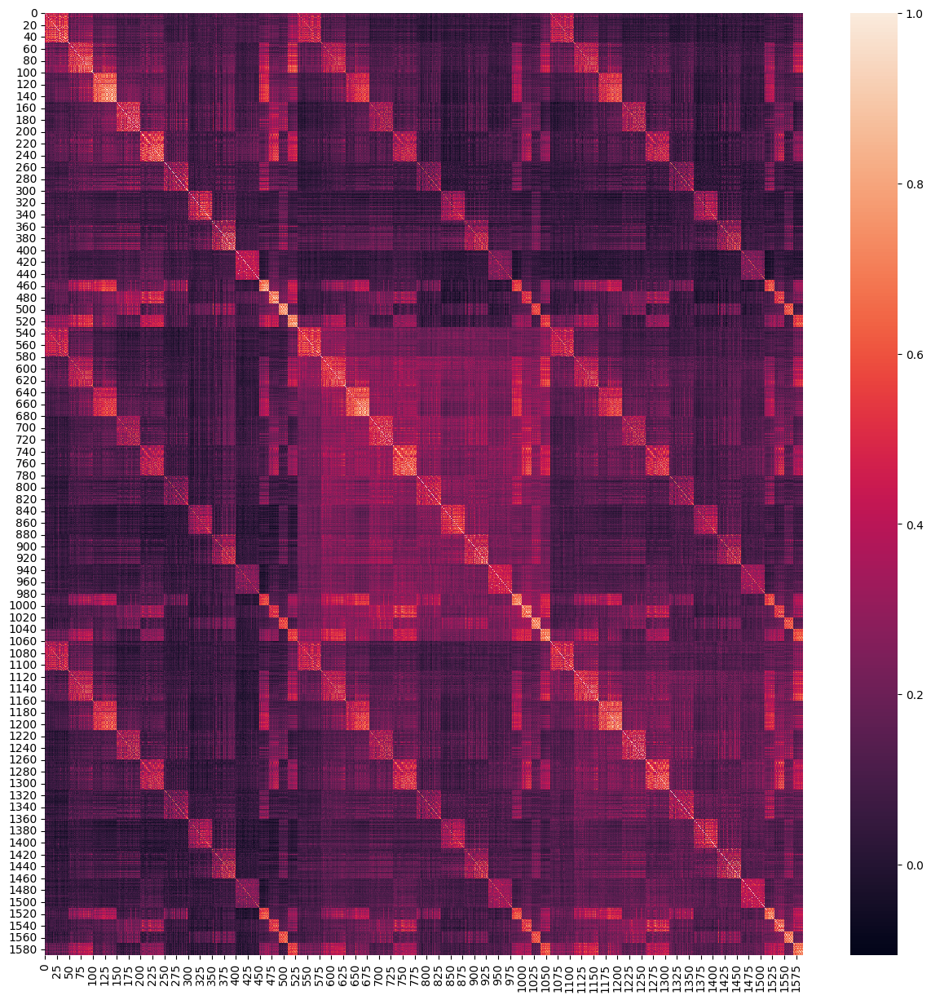

In [ ]:
import seaborn as sns
from matplotlib import pyplot as plt

plt.figure(figsize=(15,15))
sns.heatmap(standard_similarities)

In [ ]:
from sentence_transformers import SentenceTransformer


model = SentenceTransformer('sentence-transformers/LaBSE')

/usr/local/lib/python3.10/dist-packages/sentence_transformers/cross_encoder/CrossEncoder.py:11: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm, trange
/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


modules.json:   0%|          | 0.00/461 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/2.22k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/804 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/1.88G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/397 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/5.22M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/9.62M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

2_Dense/config.json:   0%|          | 0.00/114 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/2.36M [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/sentence_transformers/models/Dense.py:89: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  torch.load(os.path.join(input_path, "pytorch_

In [ ]:
labse_test = test_model(model, df)

In [ ]:
labse_similarities = labse_test.get_similarities()
labse_similarities

,0,1,2,3,4,5,6,7,8,9,...,1580,1581,1582,1583,1584,1585,1586,1587,1588,1589
0,1.000000,0.282600,0.343349,0.522940,0.479478,0.395184,0.414668,0.465882,0.253077,0.485713,...,0.131463,0.163922,0.134986,0.186085,0.179005,0.140411,0.181938,0.124048,0.183405,0.183892
1,0.282600,1.000000,0.387408,0.248651,0.445381,0.419848,0.460876,0.454210,0.506903,0.296830,...,0.323083,0.249794,0.305347,0.330826,0.289072,0.300074,0.255879,0.294509,0.338566,0.288909
2,0.343349,0.387408,1.000000,0.380490,0.408708,0.565611,0.411593,0.491652,0.428349,0.624531,...,0.411370,0.293836,0.363508,0.519332,0.328632,0.438030,0.314855,0.362718,0.516921,0.329288
3,0.522940,0.248651,0.380490,1.000000,0.459603,0.441811,0.484728,0.427814,0.356083,0.432449,...,0.315168,0.400411,0.293496,0.440039,0.374110,0.346048,0.393530,0.285643,0.437692,0.385236
4,0.479478,0.445381,0.408708,0.459603,1.000000,0.565897,0.638033,0.481444,0.655549,0.532560,...,0.387703,0.388755,0.383885,0.424798,0.417034,0.393789,0.394515,0.360108,0.424996,0.418864
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1585,0.140411,0.300074,0.438030,0.346048,0.393789,0.381726,0.472100,0.309126,0.390435,0.470381,...,0.914973,0.696148,0.767728,0.845693,0.776386,1.000000,0.747931,0.806781,0.856134,0.765919
1586,0.181938,0.255879,0.314855,0.393530,0.394515,0.408186,0.438667,0.254257,0.343051,0.372618,...,0.698487,0.932581,0.709592,0.715228,0.949268,0.747931,1.000000,0.744157,0.731372,0.956565
1587,0.124048,0.294509,0.362718,0.285643,0.360108,0.377033,0.442332,0.272993,0.334099,0.392407,...,0.726967,0.697476,0.976159,0.762854,0.790575,0.806781,0.744157,1.000000,0.772522,0.781602
1588,0.183405,0.338566,0.516921,0.437692,0.424996,0.409329,0.510463,0.393049,0.337140,0.488130,...,0.826079,0.640145,0.730232,0.988129,0.744415,0.856134,0.731372,0.772522,1.000000,0.750485


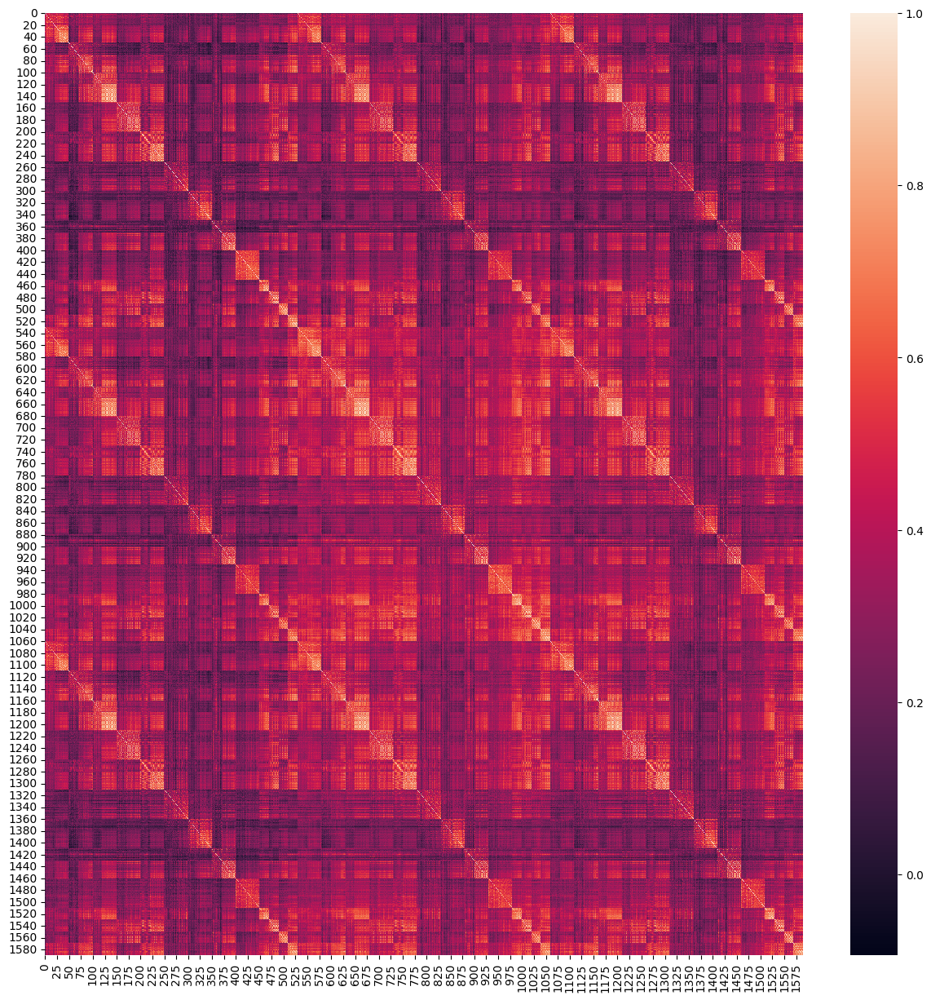

In [ ]:
labse_test.plot_similarities()

In [71]:
elapsed_times['LaBSE'] = labse_test.elapsed_time
labse_test.elapsed_time

602.9855966567993

In [ ]:
labse_mrr = calculate_mrr(standard_similarities, labse_similarities)
labse_ndcg_1 = calculate_ndcg(standard_similarities, labse_similarities, 1)
labse_map_1 = calculate_map(standard_similarities, labse_similarities, 1)
labse_ndcg_3 = calculate_ndcg(standard_similarities, labse_similarities, 3)
labse_map_3 = calculate_map(standard_similarities, labse_similarities, 3)
labse_ndcg_5 = calculate_ndcg(standard_similarities, labse_similarities, 5)
labse_map_5 = calculate_map(standard_similarities, labse_similarities, 5)
labse_ndcg_10 = calculate_ndcg(standard_similarities, labse_similarities, 10)
labse_map_10 = calculate_map(standard_similarities, labse_similarities, 10)
labse_ndcg_15 = calculate_ndcg(standard_similarities, labse_similarities, 15)
labse_map_15 = calculate_map(standard_similarities, labse_similarities, 15)

labse_datas = [labse_mrr, labse_ndcg_1, labse_map_1, labse_ndcg_3, labse_map_3, labse_ndcg_5, labse_map_5, labse_ndcg_10, labse_map_10, labse_ndcg_15, labse_map_15]
embedding_models_data.loc['LaBSE', :] = labse_datas
embedding_models_data

,mrr,ndcg-1,map-1,ndcg-3,map-3,ndcg-5,map-5,ndcg-10,map-10,ndcg-15,map-15
LaBSE,0.323923,0.0,0.0,0.291547,0.377358,0.409084,0.510839,0.520694,0.625902,0.572795,0.686278


In [ ]:
from sentence_transformers import SentenceTransformer

model = SentenceTransformer('sentence-transformers/use-cmlm-multilingual')

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/1.89k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/804 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.89G [00:00<?, ?B/s]

Some weights of the model checkpoint at sentence-transformers/use-cmlm-multilingual were not used when initializing BertModel: ['cls.predictions.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.bias', 'cls.seq_relationship.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


tokenizer_config.json:   0%|          | 0.00/411 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/5.22M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/9.62M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


1_Pooling/config.json:   0%|          | 0.00/191 [00:00<?, ?B/s]

In [ ]:
use_cmlm_test = test_model(model, df)

In [54]:
cmlm_similarities = use_cmlm_test.get_similarities()
cmlm_similarities

,0,1,2,3,4,5,6,7,8,9,...,1580,1581,1582,1583,1584,1585,1586,1587,1588,1589
0,1.000000,0.350661,0.430908,0.642543,0.473920,0.538501,0.567772,0.600323,0.150361,0.594334,...,0.340411,0.336340,0.293512,0.326822,0.287943,0.326059,0.281368,0.295189,0.316034,0.280863
1,0.350661,1.000000,0.170301,0.547791,0.133587,0.551960,0.539726,0.508144,0.085011,0.459837,...,0.548937,0.532120,0.535185,0.549004,0.522892,0.559981,0.501763,0.525597,0.535556,0.507864
2,0.430908,0.170301,1.000000,0.270317,0.479646,0.396045,0.323528,0.325932,0.328061,0.452320,...,0.140794,0.119243,0.139299,0.165446,0.122945,0.150235,0.111577,0.140703,0.176981,0.121875
3,0.642543,0.547791,0.270317,1.000000,0.325670,0.727107,0.779898,0.672177,0.128962,0.689089,...,0.666692,0.663858,0.613809,0.649791,0.615488,0.657738,0.616772,0.611150,0.631374,0.607459
4,0.473920,0.133587,0.479646,0.325670,1.000000,0.358565,0.414498,0.334800,0.493670,0.397758,...,0.126317,0.117896,0.106309,0.119389,0.089748,0.128430,0.091706,0.100744,0.125142,0.094154
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1585,0.326059,0.559981,0.150235,0.657738,0.128430,0.670718,0.639932,0.558762,0.051175,0.643019,...,0.942510,0.912749,0.920935,0.908595,0.915794,1.000000,0.898683,0.915535,0.908335,0.903735
1586,0.281368,0.501763,0.111577,0.616772,0.091706,0.587810,0.582532,0.483960,0.045681,0.561923,...,0.855175,0.920993,0.889383,0.917856,0.958790,0.898683,1.000000,0.898480,0.928946,0.965487
1587,0.295189,0.525597,0.140703,0.611150,0.100744,0.595251,0.606602,0.514246,0.052141,0.582009,...,0.880466,0.879115,0.984190,0.893681,0.932302,0.915535,0.898480,1.000000,0.896459,0.920790
1588,0.316034,0.535556,0.176981,0.631374,0.125142,0.618258,0.617691,0.540805,0.035926,0.610142,...,0.884285,0.888672,0.883113,0.988348,0.920877,0.908335,0.928946,0.896459,1.000000,0.920897


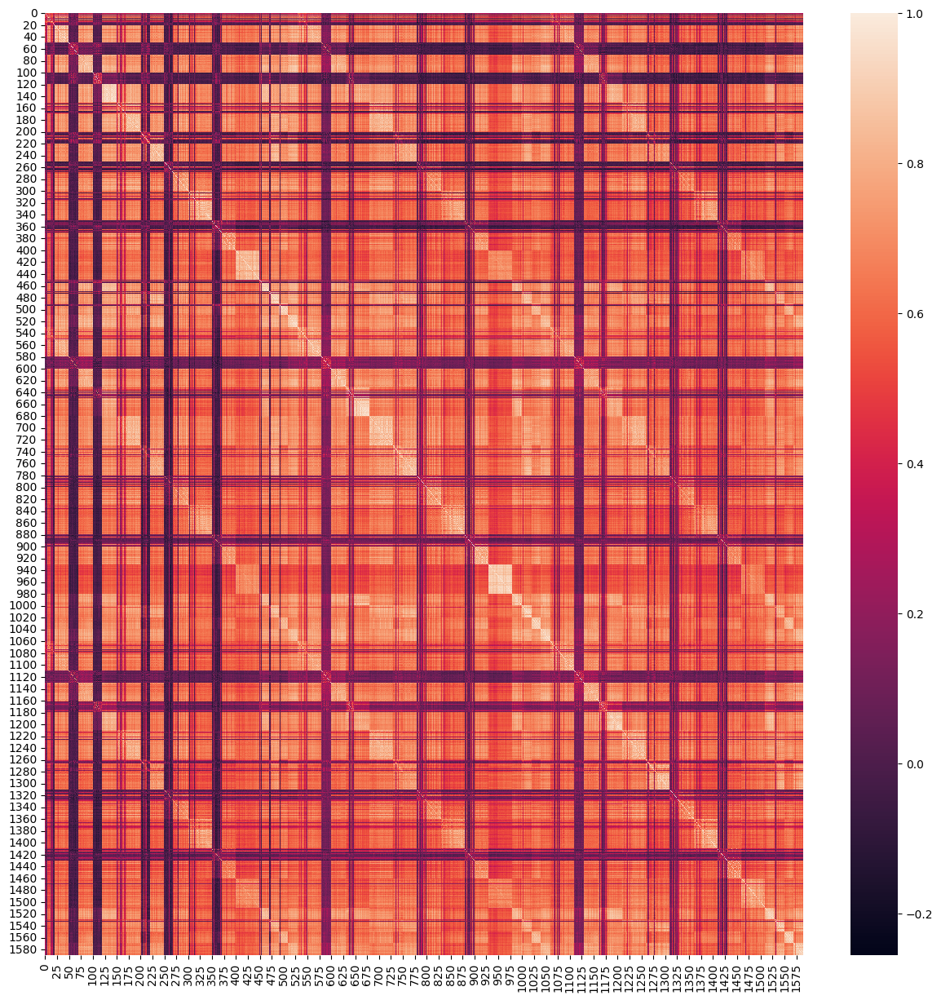

In [55]:
use_cmlm_test.plot_similarities()

In [56]:
elapsed_times['use-cmlm'] = use_cmlm_test.elapsed_time
use_cmlm_test.elapsed_time

600.6230244636536

In [58]:
use_cmlm_mrr = calculate_mrr(standard_similarities, cmlm_similarities)
use_cmlm_ndcg_1 = calculate_ndcg(standard_similarities, cmlm_similarities, 1)
use_cmlm_map_1 = calculate_map(standard_similarities, cmlm_similarities, 1)
use_cmlm_ndcg_3 = calculate_ndcg(standard_similarities, cmlm_similarities, 3)
use_cmlm_map_3 = calculate_map(standard_similarities, cmlm_similarities, 3)
use_cmlm_ndcg_5 = calculate_ndcg(standard_similarities, cmlm_similarities, 5)
use_cmlm_map_5 = calculate_map(standard_similarities, cmlm_similarities, 5)
use_cmlm_ndcg_10 = calculate_ndcg(standard_similarities, cmlm_similarities, 10)
use_cmlm_map_10 = calculate_map(standard_similarities, cmlm_similarities, 10)
use_cmlm_ndcg_15 = calculate_ndcg(standard_similarities, cmlm_similarities, 15)
use_cmlm_map_15 = calculate_map(standard_similarities, cmlm_similarities, 15)

use_cmlm_datas = [use_cmlm_mrr, use_cmlm_ndcg_1, use_cmlm_map_1, use_cmlm_ndcg_3, use_cmlm_map_3, use_cmlm_ndcg_5, use_cmlm_map_5, use_cmlm_ndcg_10, use_cmlm_map_10, use_cmlm_ndcg_15, use_cmlm_map_15]
embedding_models_data.loc['use-cmlm', :] = use_cmlm_datas
embedding_models_data

,mrr,ndcg-1,map-1,ndcg-3,map-3,ndcg-5,map-5,ndcg-10,map-10,ndcg-15,map-15
LaBSE,0.323923,0.0,0.0,0.291547,0.377358,0.409084,0.510839,0.520694,0.625902,0.572795,0.686278
use-cmlm,0.320835,0.0,0.0,0.343164,0.433019,0.424606,0.536313,0.499454,0.627049,0.528613,0.668846


In [59]:
from sentence_transformers import SentenceTransformer

model = SentenceTransformer("Alibaba-NLP/gte-multilingual-base", trust_remote_code=True)

modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/123k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/55.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.43k [00:00<?, ?B/s]

configuration.py:   0%|          | 0.00/7.13k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/Alibaba-NLP/new-impl:
- configuration.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


modeling.py:   0%|          | 0.00/59.0k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/Alibaba-NLP/new-impl:
- modeling.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


model.safetensors:   0%|          | 0.00/611M [00:00<?, ?B/s]

Some weights of the model checkpoint at Alibaba-NLP/gte-multilingual-base were not used when initializing NewModel: ['classifier.bias', 'classifier.weight']
- This IS expected if you are initializing NewModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing NewModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


tokenizer_config.json:   0%|          | 0.00/1.15k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/17.1M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/964 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

In [60]:
gte_base_test = test_model(model, df)

In [61]:
gte_similarities = gte_base_test.get_similarities()
gte_similarities

,0,1,2,3,4,5,6,7,8,9,...,1580,1581,1582,1583,1584,1585,1586,1587,1588,1589
0,1.000000,0.555261,0.693888,0.644107,0.716015,0.712034,0.651235,0.732556,0.585856,0.708069,...,0.392269,0.338477,0.311064,0.401654,0.348816,0.379585,0.369030,0.329247,0.403167,0.354431
1,0.555261,1.000000,0.551736,0.463281,0.564745,0.545487,0.619227,0.576593,0.511510,0.501661,...,0.372041,0.200406,0.279630,0.437220,0.267221,0.399052,0.271516,0.320442,0.436300,0.266963
2,0.693888,0.551736,1.000000,0.599080,0.657205,0.812968,0.622649,0.677751,0.556824,0.812660,...,0.447743,0.336348,0.349973,0.518398,0.376975,0.453014,0.388632,0.395287,0.533656,0.376833
3,0.644107,0.463281,0.599080,1.000000,0.657786,0.627300,0.635359,0.615389,0.661068,0.659349,...,0.433233,0.423839,0.360672,0.473320,0.441020,0.416331,0.460038,0.363923,0.464384,0.436230
4,0.716015,0.564745,0.657205,0.657786,1.000000,0.722818,0.776810,0.694402,0.825085,0.717965,...,0.405153,0.320918,0.310236,0.443687,0.339201,0.386771,0.366333,0.330112,0.440205,0.338607
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1585,0.379585,0.399052,0.453014,0.416331,0.386771,0.411117,0.513509,0.412292,0.348476,0.458055,...,0.910796,0.637029,0.819463,0.858889,0.751656,1.000000,0.754409,0.857272,0.880900,0.735680
1586,0.369030,0.271516,0.388632,0.460038,0.366333,0.382794,0.413389,0.349841,0.406227,0.423945,...,0.731839,0.912003,0.807827,0.712918,0.964844,0.754409,1.000000,0.792579,0.726900,0.966332
1587,0.329247,0.320442,0.395287,0.363923,0.330112,0.337296,0.453242,0.349899,0.321837,0.399405,...,0.766917,0.705629,0.976091,0.785877,0.816568,0.857272,0.792579,1.000000,0.810354,0.806018
1588,0.403167,0.436300,0.533656,0.464384,0.440205,0.450302,0.576457,0.481696,0.388333,0.503186,...,0.815859,0.624774,0.761951,0.986456,0.733162,0.880900,0.726900,0.810354,1.000000,0.718346


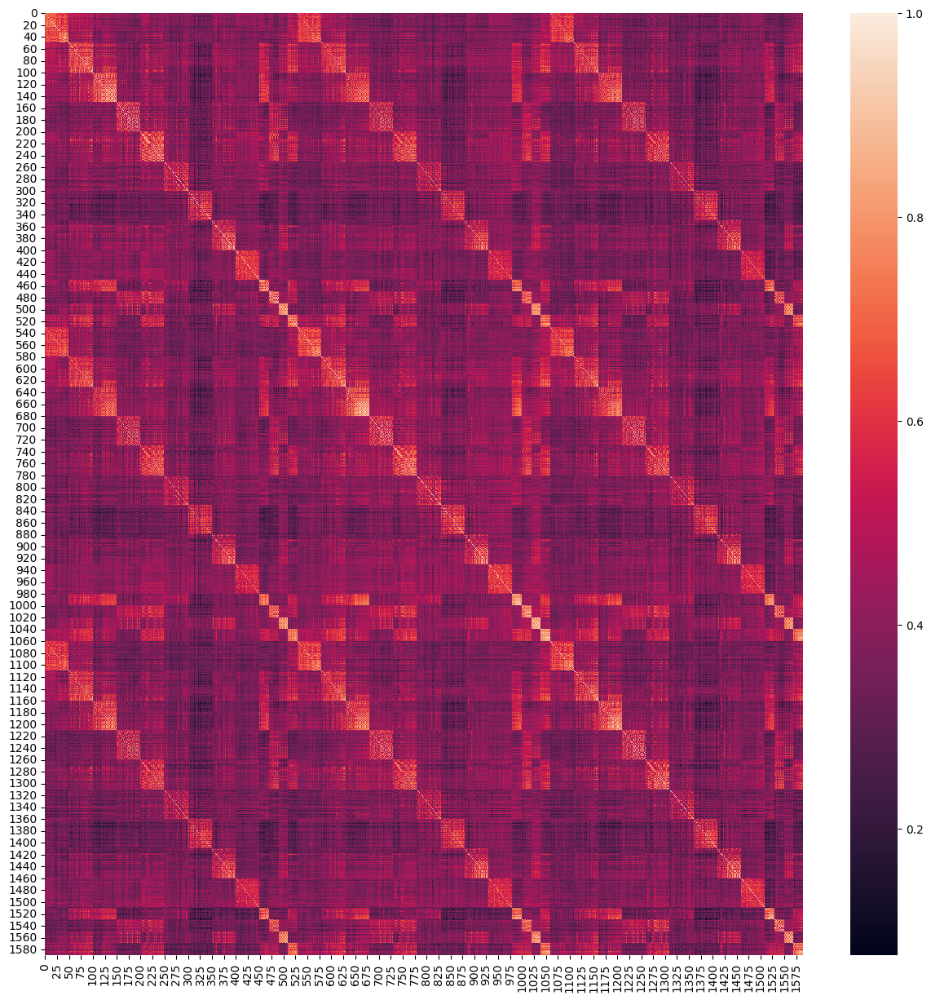

In [62]:
gte_base_test.plot_similarities()

In [63]:
elapsed_times['gte'] = gte_base_test.elapsed_time
gte_base_test.elapsed_time

932.4887588024139

In [64]:
gte_mrr = calculate_mrr(standard_similarities, gte_similarities)
gte_ndcg_1 = calculate_ndcg(standard_similarities, gte_similarities, 1)
gte_map_1 = calculate_map(standard_similarities, gte_similarities, 1)
gte_ndcg_3 = calculate_ndcg(standard_similarities, gte_similarities, 3)
gte_map_3 = calculate_map(standard_similarities, gte_similarities, 3)
gte_ndcg_5 = calculate_ndcg(standard_similarities, gte_similarities, 5)
gte_map_5 = calculate_map(standard_similarities, gte_similarities, 5)
gte_ndcg_10 = calculate_ndcg(standard_similarities, gte_similarities, 10)
gte_map_10 = calculate_map(standard_similarities, gte_similarities, 10)
gte_ndcg_15 = calculate_ndcg(standard_similarities, gte_similarities, 15)
gte_map_15 = calculate_map(standard_similarities, gte_similarities, 15)

gte_datas = [gte_mrr, gte_ndcg_1, gte_map_1, gte_ndcg_3, gte_map_3, gte_ndcg_5, gte_map_5, gte_ndcg_10, gte_map_10, gte_ndcg_15, gte_map_15]
embedding_models_data.loc['gte', :] = gte_datas
embedding_models_data

,mrr,ndcg-1,map-1,ndcg-3,map-3,ndcg-5,map-5,ndcg-10,map-10,ndcg-15,map-15
LaBSE,0.323923,0.0,0.0,0.291547,0.377358,0.409084,0.510839,0.520694,0.625902,0.572795,0.686278
use-cmlm,0.320835,0.0,0.0,0.343164,0.433019,0.424606,0.536313,0.499454,0.627049,0.528613,0.668846
gte,0.371087,0.0,0.0,0.377333,0.468553,0.475860,0.573171,0.568263,0.667362,0.608938,0.714114
